In [1]:
import sys
sys.path.append('../')
%load_ext autoreload
%autoreload 3

import xarray as xr
import matplotlib.pyplot as plt
from helpers.computational_tools import *
import xesmf as xe
import xgcm
from dask.diagnostics import ProgressBar
from helpers.plot_helpers import set_letters

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from helpers.collection_of_experiments import CollectionOfExperiments

In [2]:
lores_NW2 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/snapshots*.nc', decode_times=False).sel(time=slice(29200.001,30000))

In [3]:
ann_NW2 = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-ANN/May22-Coriolis-upd/snapshots*.nc', decode_times=False).sel(time=slice(29200.001,30000))

In [4]:
ann_longmean = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-ANN/May22-Coriolis-upd/longmean*.nc', decode_times=False).sel(time=slice(29200.001,30000))
# np.unique(ann_longmean.Esource_ZB.values)

In [5]:
ref_FGR3 = \
    xr.merge(
        [xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/filter_scale_0.75/merged_dataset.nc', decode_times=False).drop_vars(['hf','ef']),
         xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/filter_scale_0.75/interfaces-GMfilter.nc', decode_times=False)
        ]
    )

In [6]:
offline = xr.open_dataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/filter_scale_0.75/EXP1-offline.nc')

In [7]:
ref_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/static.nc', decode_times=False).squeeze().drop_vars('time')

In [8]:
lores_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R4-long/bare/output/static.nc', decode_times=False)

In [9]:
grid_lores = xgcm.Grid(lores_static.isel(time=0).drop_vars('time').squeeze(), coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
    },
    boundary={"X": 'periodic', 'Y': 'fill'},
    fill_value = {'Y':0})

In [10]:
lores_static['dxBu'] = grid_lores.interp(lores_static.dxCu, 'Y')
lores_static['dyBu'] = grid_lores.interp(lores_static.dyCu, 'Y')

lores_static['dxT'] = grid_lores.interp(lores_static.dxCu, 'X')
lores_static['dyT'] = grid_lores.interp(lores_static.dyCu, 'X')



In [11]:
grid_ref = xgcm.Grid(ref_static, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
    },
    boundary={"X": 'periodic', 'Y': 'fill'},
    fill_value = {'Y':0})

In [12]:
def APE(interface):
    '''
    Returns APE in units of kinetic energy per unit mass, i.e.
    m^3/s^2
    '''
    interface_rest = xr.DataArray([    0.,   -25.,   -75.,  -175.,  -300.,  -450.,  -625.,  -825.,
       -1050., -1300., -1600., -1950., -2350., -2850., -3400., -4000.], dims='zi')
    g = xr.DataArray([1.0e+01, 2.1e-03, 3.9e-03, 5.4e-03, 5.8e-03, 5.8e-03, 5.7e-03,
       5.3e-03, 4.8e-03, 4.2e-03, 3.7e-03, 3.1e-03, 2.4e-03, 1.7e-03,
       1.1e-03, 0.0e+00], dims='zi')
    
    coordinate_of_bottom = interface.isel(zi=-1).drop_vars(['zi'])
    
    hint = interface - interface_rest
    
    # Where bottom is upper than the rest interface
    hbot = np.maximum(coordinate_of_bottom - interface_rest,0)
    
    APE_instant = (0.5 * g * (hint**2))
    APE_constant = (0.5 * g * (hbot**2))
    
    return (APE_instant - APE_constant).sum('zi')

In [13]:
def energy(data):
    data = data.chunk({'zl':1})
    try:
        h = (data.e.isel(zi=slice(0,-1)).drop_vars('zi') - data.e.isel(zi=slice(1,None)).drop_vars('zi')).rename({'zi': 'zl'})
    except:
        h = data.h
    out = xr.Dataset()

    KEu = (data.u**2 * grid_lores.interp(h,'X') * 0.5).chunk({'yh':100}).mean('time').compute()
    KEv = (data.v**2 * grid_lores.interp(h,'Y') * 0.5).chunk({'xh':100}).mean('time').compute()
    
    out['KE'] = (grid_lores.interp(KEu,'X') + grid_lores.interp(KEv,'Y')).sum('zl')

    uom = data.u.chunk({'yh':100}).mean('time').compute()
    vom = data.v.chunk({'yq':100}).mean('time').compute()
    hm = h.chunk({'yh':100}).mean('time').compute()

    KEu = (uom**2 * grid_lores.interp(hm,'X') * 0.5)
    KEv = (vom**2 * grid_lores.interp(hm,'Y') * 0.5)

    out['MKE'] = (grid_lores.interp(KEu,'X') + grid_lores.interp(KEv,'Y')).sum('zl')

    out['EKE'] = out['KE'] - out['MKE']

    try:
        out['APE'] = APE(data.e).mean('time').compute()
        out['MPE'] = APE(data.e.mean('time')).compute()
        out['EPE'] = out['APE'] - out['MPE']
    except:
        pass
    

    return out

In [14]:
%%time
energy_ctrl = energy(lores_NW2)

CPU times: user 37.4 s, sys: 34.3 s, total: 1min 11s
Wall time: 1min 49s


In [15]:
energy_ann = energy(ann_NW2)

In [16]:
energy_ref_FGR3 = energy(ref_FGR3.rename({'hf':'h','uf':'u','vf':'v','ef':'e'}))

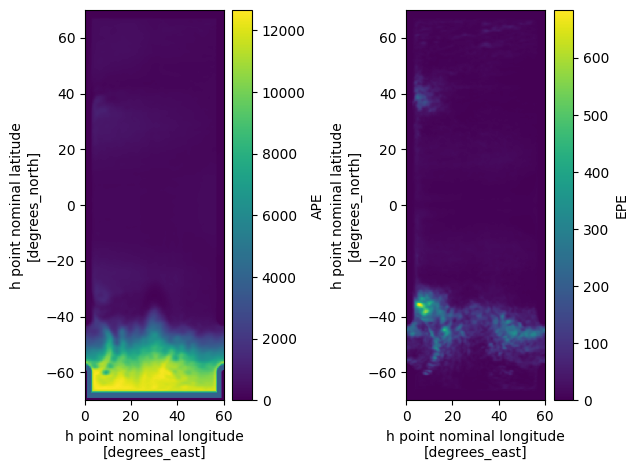

In [36]:
plt.subplot(1,2,1)
energy_ref_FGR3.APE.plot()
plt.subplot(1,2,2)
energy_ref_FGR3.EPE.plot()
plt.tight_layout()

In [40]:
print(1000 * (energy_ref_FGR3.APE * lores_static.area_t).sum(['xh','yh']).compute())
print(1000 * (energy_ref_FGR3.EPE * lores_static.area_t).sum(['xh','yh']).compute())
print(1000 * (energy_ref_FGR3.MPE * lores_static.area_t).sum(['xh','yh']).compute())

<xarray.DataArray ()> Size: 8B
array(9.58236893e+19)
<xarray.DataArray ()> Size: 8B
array(1.92048669e+18)
<xarray.DataArray ()> Size: 8B
array(9.39032026e+19)


In [41]:
print(1000 * (energy_ref_FGR3.KE * lores_static.area_t).sum(['xh','yh']).compute())
print(1000 * (energy_ref_FGR3.EKE * lores_static.area_t).sum(['xh','yh']).compute())
print(1000 * (energy_ref_FGR3.MKE * lores_static.area_t).sum(['xh','yh']).compute())

<xarray.DataArray ()> Size: 8B
array(1.93715965e+18)
<xarray.DataArray ()> Size: 8B
array(1.66699337e+18)
<xarray.DataArray ()> Size: 8B
array(2.7016628e+17)


In [17]:
import matplotlib as mpl
def plot(field, factor=1,  vmin=1e-1, vmax=1e+3, norm='linear', cmap=cmocean.cm.balance, label='KE', vcenter=0, contourf=False, levels=None, shrink=0.75):
    if norm=='linear':
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    elif norm=='two_slope':
        norm = mpl.colors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    elif norm=='symlog':
        norm = mpl.colors.SymLogNorm(linthresh=vmin, vmin=-vmax, vmax=vmax)
    elif norm=='log':
        norm=mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
    if contourf:
        im = field.coarsen({'xh': factor, 'yh': factor}).mean().plot.contourf(
            norm=norm,
            cmap=cmap,
            add_colorbar=False,
            levels=levels
        )    
        field.coarsen({'xh': factor, 'yh': factor}).mean().plot.contour(
            levels=levels, colors='k', linewidths=0.5
        ) 
    else:
        im = field.coarsen({'xh': factor, 'yh': factor}).mean().plot.imshow(
            norm=norm,
            cmap=cmap,
            add_colorbar=False,
            interpolation='none',
            rasterized=True
        )
    plt.gca().axes.set_aspect('equal')
    plt.xlabel('')
    plt.ylabel('')
    plt.title(label, fontsize=10)
    lons = [10,30,50]
    plt.xticks(lons, [f'${lon}^'+'{\circ}$E' for lon in lons])
    lats = [-60, -40, -20, 0, 20, 40, 60]
    lat_ticks = [f'${-lat}^'+'{\circ}$S' if lat<0 else f'${lat}^'+'{\circ}$N' for lat in lats]
    plt.yticks(lats, lat_ticks)    
    plt.colorbar(im, shrink=shrink, orientation='vertical', ax=plt.gca(), extend='both').set_label(fontsize=13, label=label)
    plt.title('')

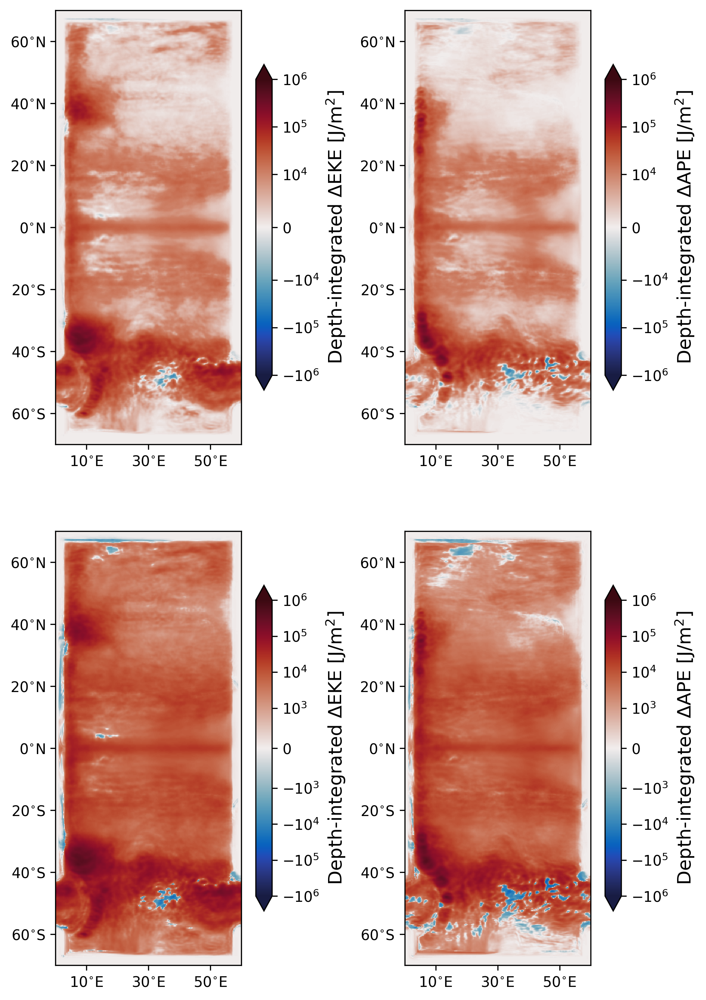

In [20]:
rho0 = 1035.
plt.figure(figsize=(8,12), dpi=300)
plt.subplot(2,2,1)
plot(rho0*(energy_ref_FGR3.EKE - energy_ctrl.EKE), vmin=1e+4, vmax=1e+6, label='Depth-integrated $\Delta$EKE [J/m$^2$]', norm='symlog', factor=1)
plt.subplot(2,2,2)
plot(rho0*(energy_ann.EKE - energy_ctrl.EKE), vmin=1e+4, vmax=1e+6, label='Depth-integrated $\Delta$APE [J/m$^2$]', norm='symlog', factor=1)

plt.subplot(2,2,3)
plot(rho0*(energy_ref_FGR3.EKE - energy_ctrl.EKE), vmin=1e+3, vmax=1e+6, label='Depth-integrated $\Delta$EKE [J/m$^2$]', norm='symlog', factor=1)
plt.subplot(2,2,4)
plot(rho0*(energy_ann.EKE - energy_ctrl.EKE), vmin=1e+3, vmax=1e+6, label='Depth-integrated $\Delta$APE [J/m$^2$]', norm='symlog', factor=1)



#plt.tight_layout()
#plt.savefig('delta-metrics-hires-dEdt.pdf', dpi=200)

In [21]:
dEdt_ref = (ref_FGR3.dEdt * ref_FGR3.hf).sum('zl').mean('time').compute()

In [22]:
SGS_back_ref = (ref_FGR3.SGS_back * ref_FGR3.hf).sum('zl').mean('time').compute()

In [23]:
def velocity_gradients(u=None, v=None):
    param = lores_static
    grid = grid_lores

    dudx = grid.diff(u * param.wet_u / param.dyCu, 'X') * param.dyT / param.dxT * param.wet
    dvdy = grid.diff(v * param.wet_v / param.dxCv, 'Y') * param.dxT / param.dyT * param.wet

    dudy = grid.diff(u * param.wet_u / param.dxCu, 'Y') * param.dxBu / param.dyBu * param.wet_c
    dvdx = grid.diff(v * param.wet_v / param.dyCv, 'X') * param.dyBu / param.dxBu * param.wet_c
    
    sh_xx = dudx-dvdy
    sh_xy_h = grid.interp(dvdx+dudy, ['X', 'Y']) * param.wet
    vort_xy_h=grid.interp(dvdx-dudy, ['X', 'Y']) * param.wet
    div = dudx+dvdy
    
    return sh_xx, sh_xy_h, vort_xy_h, div

In [24]:
sh_xx, sh_xy, vort_xy_h, div = velocity_gradients(ann_NW2.u,ann_NW2.v)

In [19]:
with ProgressBar():
    Tdd = 0.5 * (ann_NW2['Txx'] - ann_NW2['Tyy'])
    Ttr = 0.5 * (ann_NW2['Txx'] + ann_NW2['Tyy'])
    Txy = grid_lores.interp(ann_NW2.Txy, ['X','Y'])
    # Positive number means backscatter
    SGS_back_ann = (- (Tdd * sh_xx + Ttr * div + Txy * sh_xy) * ann_NW2.h).sum('zl').mean('time').compute()

[########################################] | 100% Completed | 122.17 s


In [25]:
dEdt_ann = ((grid_lores.interp(ann_NW2.ZB2020u * ann_NW2.u, 'X') + grid_lores.interp(ann_NW2.ZB2020v * ann_NW2.v, 'Y')) * ann_NW2.h).sum('zl').mean('time').compute()

In [26]:
dEdt_ann_offline = (offline.dEdt * ref_FGR3.hf).sum('zl').mean('time').compute()

In [ ]:
SGS_back_ann_offline = (offline.SGS_back * ref_FGR3.hf).sum('zl').mean('time').compute()

Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped


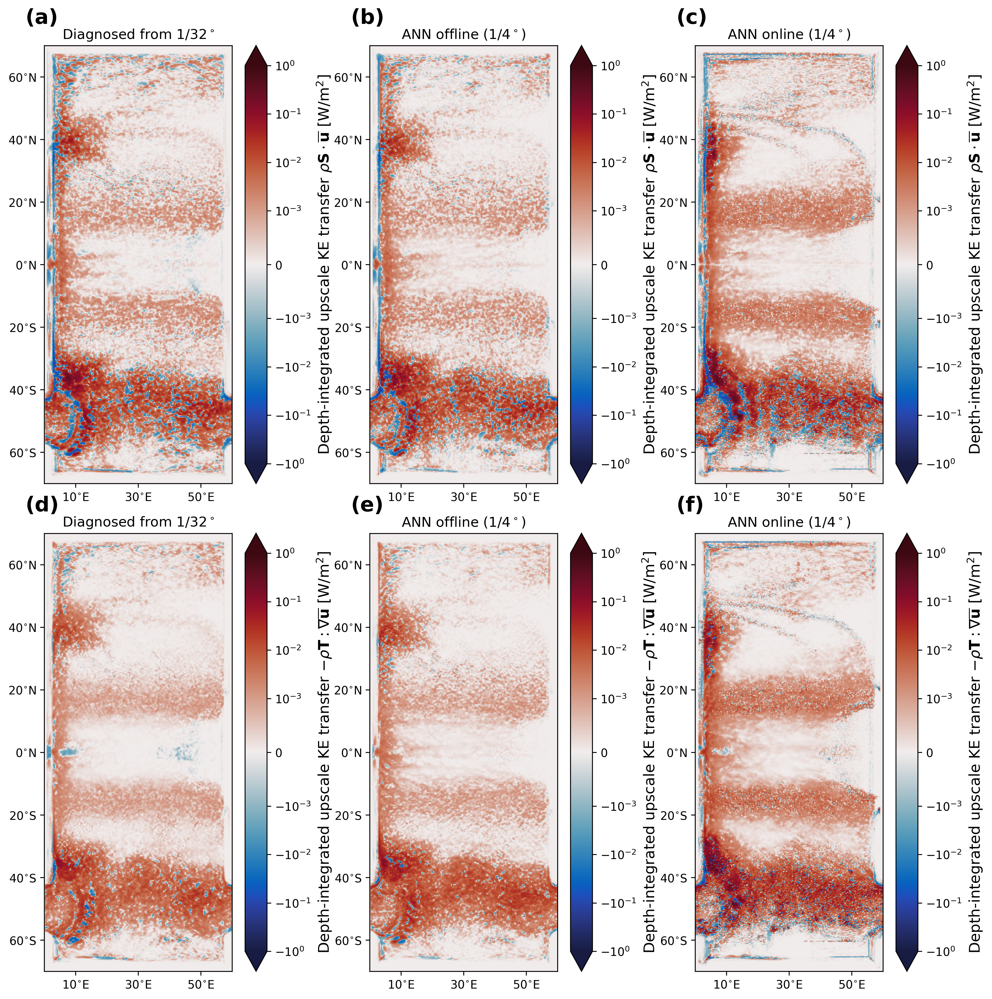

In [39]:
rho0 = 1035.
plt.figure(figsize=(12,12), dpi=300)

plt.subplot(2,3,1)
plot(rho0*(dEdt_ref), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('Diagnosed from $1/32^\circ$')
plt.subplot(2,3,2)
plot(rho0*(dEdt_ann_offline), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('ANN offline ($1/4^\circ$)')
plt.subplot(2,3,3)
plot(rho0*(dEdt_ann), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('ANN online ($1/4^\circ$)')

plt.subplot(2,3,4)
plot(rho0*(SGS_back_ref), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $-\\rho \\mathbf{T} : \\nabla\\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('Diagnosed from $1/32^\circ$')
plt.subplot(2,3,5)
plot(rho0*(SGS_back_ann_offline), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $-\\rho \\mathbf{T} : \\nabla\\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('ANN offline ($1/4^\circ$)')
plt.subplot(2,3,6)
plot(rho0*(SGS_back_ann), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $-\\rho \\mathbf{T} : \\nabla\\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1, shrink=1)
plt.title('ANN online ($1/4^\circ$)')

plt.tight_layout()
set_letters(x=-0.1,y=1.05,fontsize=18)
plt.savefig('KE-transfer-offline-online.pdf', bbox_inches='tight', dpi=200)

Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped


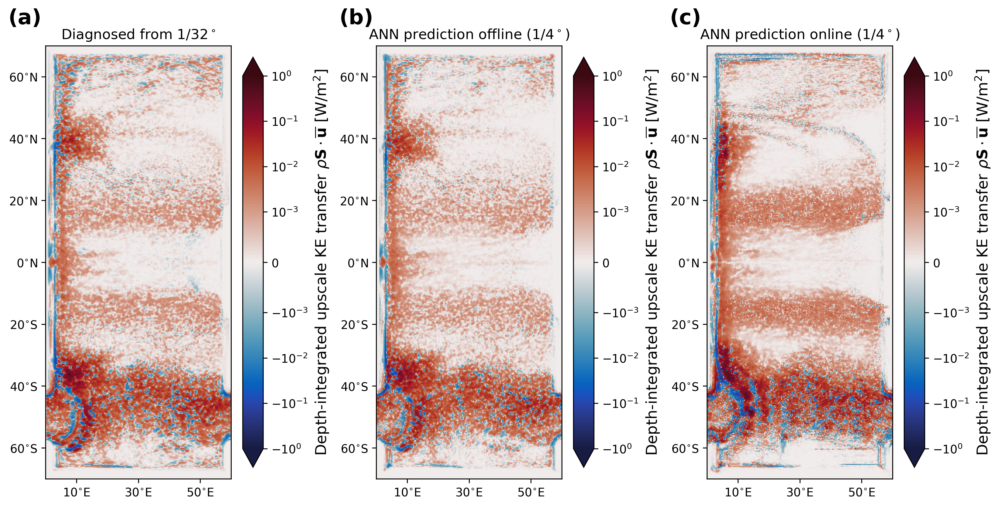

In [31]:
rho0 = 1035.
plt.figure(figsize=(12,7), dpi=300)

plt.subplot(1,3,1)
plot(rho0*(dEdt_ref), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1)
plt.title('Diagnosed from $1/32^\circ$')
plt.subplot(1,3,2)
plot(rho0*(dEdt_ann_offline), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1)
plt.title('ANN prediction offline ($1/4^\circ$)')
plt.subplot(1,3,3)
plot(rho0*(dEdt_ann), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1)
plt.title('ANN prediction online ($1/4^\circ$)')

plt.tight_layout()
set_letters(x=-0.2,y=1.05,fontsize=18)
plt.savefig('KE-transfer-offline-online-3-panels.pdf', bbox_inches='tight', dpi=200)

# Explaining marginal difference in KE transfer by distribution shift of input features

In [6]:
ref = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/snapshots*.nc', decode_times=False)

In [17]:
import xrft
sp = lambda x: xrft.power_spectrum(x.sel(yh=slice(-60,-40)).isel(zl=5).isel(xq=slice(1,None)).compute(),dim='xq',truncate=True).mean(['time', 'yh'])
with ProgressBar():
    sp_ref = sp(ref_FGR3.uf).compute()
    sp_ann = sp(ann_NW2.u).compute()
    sp_lores = sp(lores_NW2.u).compute()

[########################################] | 100% Completed | 29.71 s
[########################################] | 100% Completed | 14.81 s
[########################################] | 100% Completed | 14.28 s


In [18]:
with ProgressBar():
    sp_hires = sp(ref.u).compute()

[########################################] | 100% Completed | 96.78 s


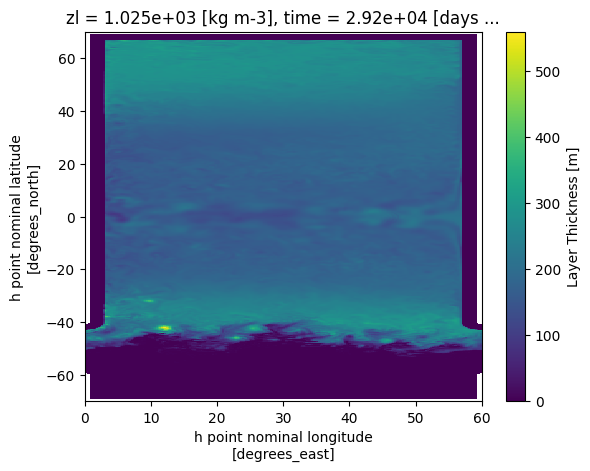

In [19]:
ann_NW2.h.isel(zl=5,time=0).plot()

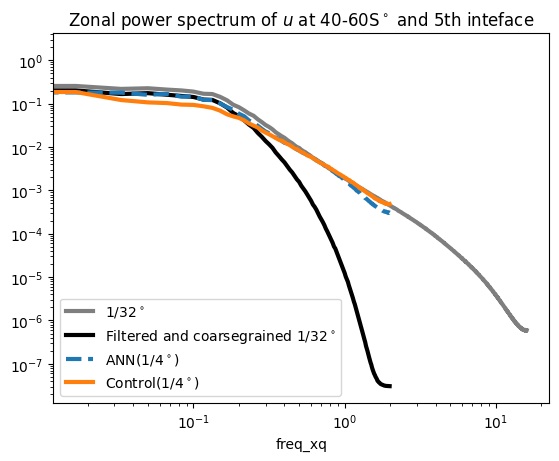

In [22]:
sp_hires.plot(xscale='log',yscale='log',color='tab:gray', lw=3,label='$1/32^\circ$')
sp_ref.plot(xscale='log',yscale='log',color='k', lw=3,label='Filtered and coarsegrained $1/32^\circ$')
sp_ann.plot(xscale='log',yscale='log',label='ANN($1/4^\circ$)', lw=3, ls='--')
sp_lores.plot(xscale='log',yscale='log',label='Control($1/4^\circ$)', lw=3)
plt.title('Zonal power spectrum of $u$ at 40-60S$^\circ$ and 5th inteface')
plt.legend()

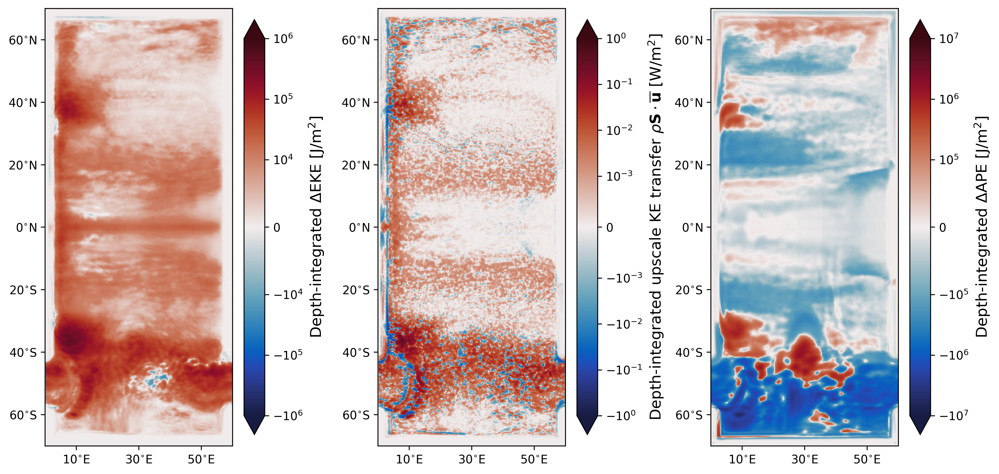

In [139]:
rho0 = 1035.
plt.figure(figsize=(12,7), dpi=300)
plt.subplot(1,3,2)
plot(rho0*(dEdt_ref), vmin=1e-3, vmax=1, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1)
plt.subplot(1,3,1)
plot(rho0*(energy_ref_FGR3.EKE - energy_ctrl.EKE), vmin=1e+4, vmax=1e+6, label='Depth-integrated $\Delta$EKE [J/m$^2$]', norm='symlog', factor=1)
plt.subplot(1,3,3)
plot(rho0*(energy_ref_FGR3.APE - energy_ctrl.APE), vmin=1e+5, vmax=1e+7, label='Depth-integrated $\Delta$APE [J/m$^2$]', norm='symlog', factor=1)

plt.tight_layout()
plt.savefig('delta-metrics-hires-dEdt.pdf', dpi=200)

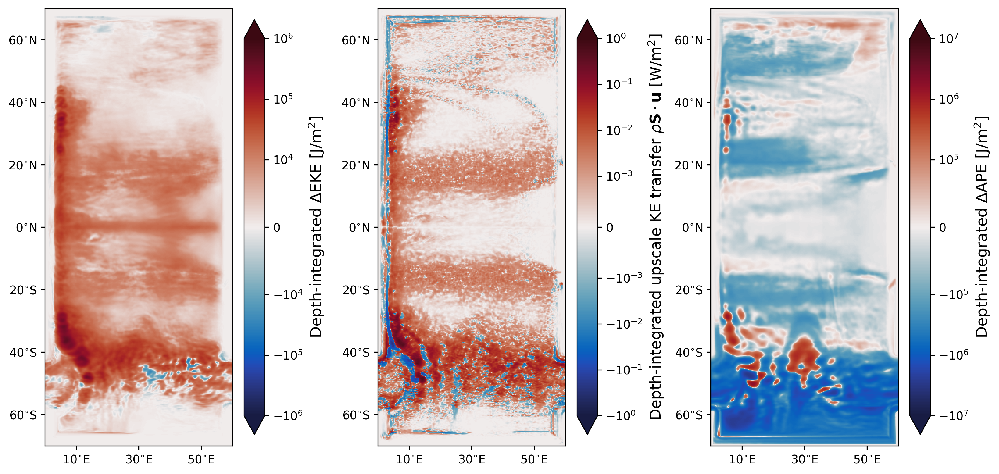

In [135]:
rho0 = 1035.
plt.figure(figsize=(12,7), dpi=300)
plt.subplot(1,3,2)
plot(rho0*(dEdt_ann_ave), vmin=1e-3, vmax=1e+0, label='Depth-integrated upscale KE transfer $\\rho \\mathbf{S} \\cdot \\overline{\\mathbf{u}}$ [W/m$^2$]', norm='symlog', factor=1)
plt.subplot(1,3,1)
plot(rho0*(energy_ann.EKE - energy_ctrl.EKE), vmin=1e+4, vmax=1e+6, label='Depth-integrated $\Delta$EKE [J/m$^2$]', norm='symlog', factor=1)
plt.subplot(1,3,3)
plot(rho0*(energy_ann.APE - energy_ctrl.APE), vmin=1e+5, vmax=1e+7, label='Depth-integrated $\Delta$APE [J/m$^2$]', norm='symlog', factor=1)
# plt.subplot(1,4,4)
# psi_lores.plot.contour(levels=np.arange(-300,300,10), colors='k', linewidths=0.5)
# plot(grid.interp(psi_ann - psi_lores, 'X'), vmin=10, vmax=100, label='Barotropic streamfunction $\Delta\Psi$ [Sv]', norm='symlog', factor=1)


#plt.suptitle('ANN($1/4^\circ$)-Control($1/4^\circ$)', y=0.95)
plt.tight_layout()
plt.savefig('delta-metrics-lores-dEdt-ave.pdf', dpi=200)

# Barotropic streamfunction

/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent 

Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped
Colorbar-like object skipped


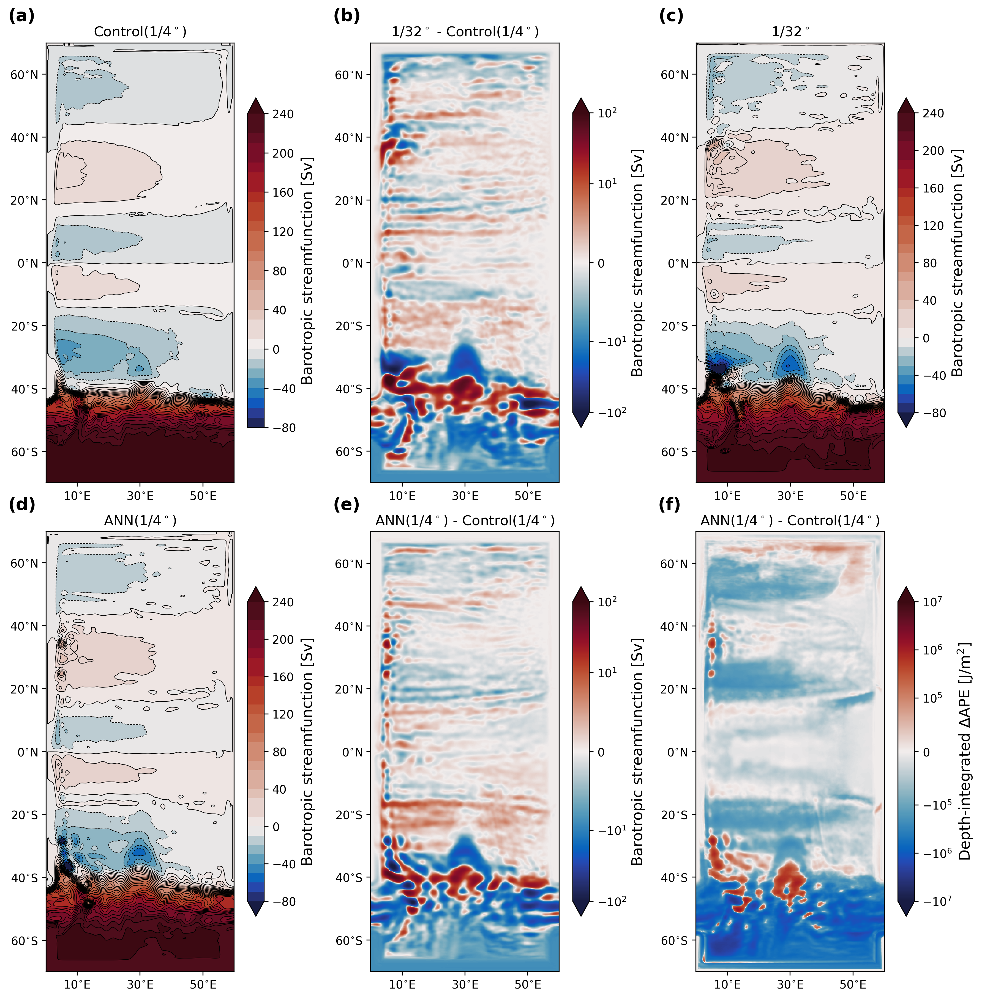

In [57]:
from helpers.plot_helpers import set_letters
rho0 = 1035.
plt.figure(figsize=(12,12), dpi=300)

plt.subplot(2,3,1)
plot(grid.interp(psi_lores, 'X'), vmin=-80, vmax=240, vcenter=0, norm='two_slope', contourf=True, levels=np.arange(-80, 250, 10), label='Barotropic streamfunction [Sv]')
plt.title('Control($1/4^\circ$)')

plt.subplot(2,3,2)
plot(grid.interp(psi_r-psi_lores, 'X'), vmin=10, vmax=100,  norm='symlog', contourf=False, label='Barotropic streamfunction [Sv]')
plt.title('$1/32^\circ$ - Control($1/4^\circ$)')

plt.subplot(2,3,3)
plot(grid.interp(psi_r, 'X'), vmin=-80, vmax=240, vcenter=0, norm='two_slope', contourf=True, levels=np.arange(-80, 250, 10), label='Barotropic streamfunction [Sv]')
plt.title('$1/32^\circ$')

#rmse = np.sqrt(np.nanmean(psi_lores - psi_r)**2)
#plt.text(25,60,'RMSE=%.1f Sv' % rmse)


# plt.subplot(2,3,4)
# plot(grid.interp(psi_r-psi_ann, 'X'), vmin=-20, vmax=20, vcenter=0, norm='linear', contourf=False, label='Sv')
# plt.title('$1/32^\circ$ - ANN($1/4^\circ$)')

plt.subplot(2,3,4)
plot(grid.interp(psi_ann, 'X'), vmin=-80, vmax=240, vcenter=0, norm='two_slope', contourf=True, levels=np.arange(-80, 250, 10), label='Barotropic streamfunction [Sv]')
plt.title('ANN($1/4^\circ$)')
#rmse = np.sqrt(np.nanmean(psi_ann - psi_r)**2)
#plt.text(25,60,'RMSE=%.1f Sv' % rmse)

plt.subplot(2,3,5)
plot(grid.interp(psi_ann-psi_lores, 'X'), vmin=10, vmax=100, vcenter=0, norm='symlog', contourf=False, label='Barotropic streamfunction [Sv]')
plt.title('ANN($1/4^\circ$) - Control($1/4^\circ$)')

plt.subplot(2,3,6)
plot(rho0*(energy_ann.APE - energy_ctrl.APE), vmin=1e+5, vmax=1e+7, label='Depth-integrated $\Delta$APE [J/m$^2$]', norm='symlog', factor=1)
plt.title('ANN($1/4^\circ$) - Control($1/4^\circ$)')

plt.tight_layout()
set_letters(fontsize=15)
plt.savefig('streamfunction-NW2-upd.pdf', bbox_inches='tight')

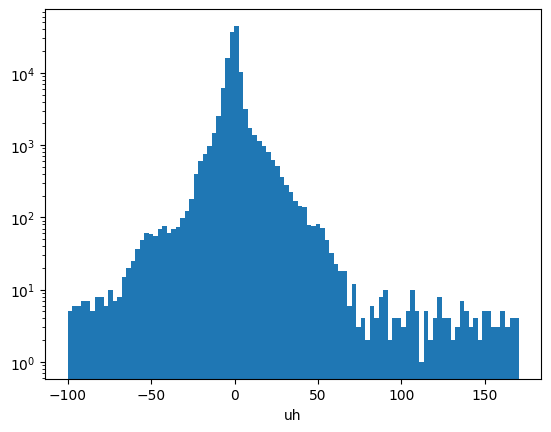

In [45]:
(psi_r-psi_lores).plot.hist(bins=100);
plt.yscale('log')

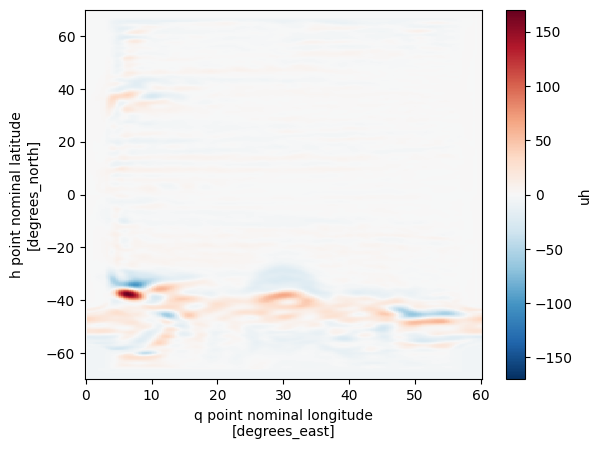

In [49]:
(psi_r-psi_lores).plot()

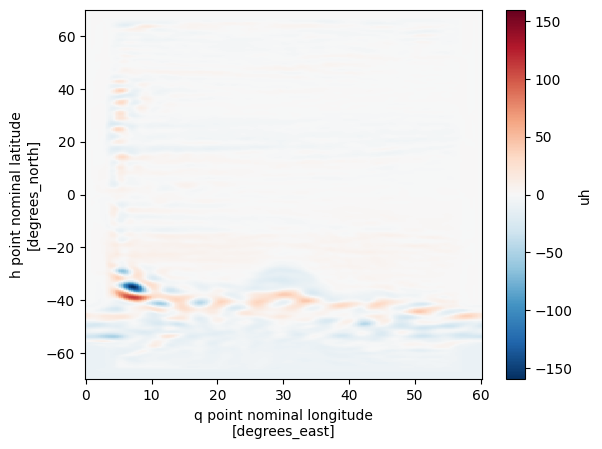

In [50]:
(psi_ann-psi_lores).plot()

# Subfilter stress

In [2]:
ref = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/snapshots_*', decode_times=False, chunks={'time':1}).isel(time=slice(None,None,6))[['u','v','h','e']]
ref_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/static.nc', decode_times=False).squeeze().drop_vars('time')

In [14]:
# Generate missing grid information
grid_ref = xgcm.Grid(ref_static, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
    },
    boundary={"X": 'periodic', 'Y': 'fill'},
    fill_value = {'Y':0})

ref_static['dxBu'] = grid_ref.interp(ref_static.dxCu, 'Y')
ref_static['dyBu'] = grid_ref.interp(ref_static.dyCu, 'Y')

ref_static['dxT'] = grid_ref.interp(ref_static.dxCu, 'X')
ref_static['dyT'] = grid_ref.interp(ref_static.dyCu, 'X')

/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent 

In [15]:
grid_ref = xgcm.Grid(ref_static, coords={
        'X': {'center': 'xh', 'outer': 'xq'},
        'Y': {'center': 'yh', 'outer': 'yq'}
    },
    boundary={"X": 'periodic', 'Y': 'fill'},
    fill_value = {'Y':0})

def KE_Arakawa(u, v):
        '''
        https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L1000-L1003
        '''
        param = ref_static
        grid = grid_ref
        
        areaCu = param.dxCu * param.dyCu
        areaCv = param.dxCv * param.dyCv
        areaT = param.dxT * param.dyT
        
        KEu = grid.interp(param.wet_u * areaCu * u**2, 'X')
        KEv = grid.interp(param.wet_v * areaCv * v**2, 'Y')

        return 0.5 * (KEu + KEv) / areaT * param.wet

def gradKE(u,v):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L1029-L1034
    '''
    
    param = ref_static
    grid = grid_ref

    KE = KE_Arakawa(u,v)
    IdxCu = 1. / param.dxCu
    IdyCv = 1. / param.dyCv

    KEx = grid.diff(KE, 'X') * IdxCu * param.wet_u
    KEy = grid.diff(KE, 'Y') * IdyCv * param.wet_v
    return (KEx, KEy)

def relative_vorticity(u,v):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L472
    '''
    param = ref_static
    grid = grid_ref
    
    dyCv = param.dyCv
    dxCu = param.dxCu
    IareaBu = 1. / (param.dxBu * param.dyBu)
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L309-L310
    dvdx = grid.diff(param.wet_v * v * dyCv,'X')
    dudy = grid.diff(param.wet_u * u * dxCu,'Y')
    return ((dvdx - dudy) * IareaBu * param.wet_c).squeeze()

def PV_cross_uv(u,v):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L669-L671
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L788-L790
    fx = + q * vh
    fy = - q * uh
    '''
    param = ref_static
    grid = grid_ref
    
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L131
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_continuity_PPM.F90#L569-L570
    uh = u * param.dyCu * param.wet_u
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L133
    vh = v * param.dxCv * param.wet_v
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L484
    rel_vort = relative_vorticity(u,v)

    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L247
    Area_h = param.dxT * param.dyT
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L272-L273
    Area_q = grid.interp(Area_h, ['X', 'Y']) * 4
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L323
    hArea_u = grid.interp(Area_h,'X')
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L320
    hArea_v = grid.interp(Area_h,'Y')
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L488
    hArea_q = 2 * grid.interp(hArea_u,'Y') + 2 * grid.interp(hArea_v,'X')
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L489
    Ih_q = Area_q / hArea_q

    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L490
    q = rel_vort * Ih_q

    IdxCu = 1. / param.dxCu
    IdyCv = 1. / param.dyCv
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L669-L671
    CAu = + grid.interp(q * grid.interp(vh,'X'),'Y') * IdxCu * param.wet_u
    # https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L788-L790
    CAv = - grid.interp(q * grid.interp(uh,'Y'),'X') * IdyCv * param.wet_v

    return (CAu, CAv)

def advection(u,v):
    '''
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L751
    https://github.com/NOAA-GFDL/MOM6/blob/dev/gfdl/src/core/MOM_CoriolisAdv.F90#L875

    $- (u nabla) u$ operator, i.e. it is advection acceleration in RHS
    '''
    CAu, CAv = PV_cross_uv(u,v)
    KEx, KEy = gradKE(u,v)
    return (CAu - KEx, CAv - KEy)

In [7]:
filter_u = gcm_filters.Filter(
                filter_scale=(32/4 * 3), # filter scale accounts for change in resolution (32/4) and FGR (3)
                dx_min=1,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.REGULAR_WITH_LAND,
                grid_vars={'wet_mask': ref_static.wet_u}
                )

filter_v = gcm_filters.Filter(
                filter_scale=(32/4 * 3), # filter scale accounts for change in resolution (32/4) and FGR (3)
                dx_min=1,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.REGULAR_WITH_LAND,
                grid_vars={'wet_mask': ref_static.wet_v}
                )

filter_h = gcm_filters.Filter(
                filter_scale=(32/4 * 3), # filter scale accounts for change in resolution (32/4) and FGR (3)
                dx_min=1,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.REGULAR_WITH_LAND,
                grid_vars={'wet_mask': ref_static.wet}
                )

In [6]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    uf = filter_u.apply(ref.u, dims=['yh', 'xq']).chunk({'time':1}).compute()
    uf.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/uf_0.75_filter_scale.nc')

[########################################] | 100% Completed | 478.39 s


In [7]:
del uf

In [8]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    vf = filter_v.apply(ref.v, dims=['yq', 'xh']).chunk({'time':1}).compute()
    vf.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/vf_0.75_filter_scale.nc')

[########################################] | 100% Completed | 11m 7ss


In [6]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    hf = filter_h.apply(ref.h, dims=['yh', 'xh']).compute()
    hf.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/hf_0.75_filter_scale.nc')

[########################################] | 100% Completed | 15m 2ss


In [7]:
del hf

In [6]:
advx_hires, advy_hires = advection(ref.u, ref.v)

/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent 

In [11]:
# from dask.diagnostics import ProgressBar
# with ProgressBar():
#     advx_hires.astype('float32').chunk({'time':1}).compute().to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advx_hires_0.75_filter_scale.nc')
#     del advx_hires

In [12]:
with ProgressBar():
    advy_hires.astype('float32').chunk({'time':1}).compute().to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advy_hires_0.75_filter_scale.nc')
    del advy_hires

[########################################] | 100% Completed | 224.51 s


In [14]:
advx_hires = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advx_hires_0.75_filter_scale.nc', chunks={'time':1}).__xarray_dataarray_variable__

In [17]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    advx_filtered_tendency = filter_u.apply(advx_hires, dims=['yh', 'xq']).compute()
    advx_filtered_tendency.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advx_filtered_tendency_0.75_filter_scale.nc')

[########################################] | 100% Completed | 466.62 s


In [18]:
del advx_hires, advx_filtered_tendency

In [19]:
advy_hires = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advy_hires_0.75_filter_scale.nc', chunks={'time':1}).__xarray_dataarray_variable__
with ProgressBar():
    advy_filtered_tendency = filter_v.apply(advy_hires, dims=['yq', 'xh']).compute()
    advy_filtered_tendency.to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advy_filtered_tendency_0.75_filter_scale.nc')

[########################################] | 100% Completed | 466.78 s


In [20]:
del advy_hires, advy_filtered_tendency

In [22]:
uf = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/uf_0.75_filter_scale.nc', chunks={'time':1}).__xarray_dataarray_variable__

In [24]:
vf = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/vf_0.75_filter_scale.nc', chunks={'time':1}).__xarray_dataarray_variable__

In [30]:
advx_filtered_state, advy_filtered_state = advection(uf, vf)

/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent 

In [34]:
with ProgressBar():
    advx_filtered_state.transpose('time','zl',...).astype('float32').compute().to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/advx_filtered_state_0.75_filter_scale.nc')

[########################################] | 100% Completed | 108.92 s


In [36]:
with ProgressBar():
    advy_filtered_state.transpose('time','zl',...).astype('float32').compute().to_netcdf(
        '/scratch/pp2681/mom6/Neverworld2/simulations/R32/advy_filtered_state_0.75_filter_scale.nc')


[########################################] | 100% Completed | 113.66 s


# Lazy coarsening

In [62]:
ds = xr.Dataset()
for key in ['uf', 'vf', 'hf', 'advx_filtered_tendency', 'advy_filtered_tendency', 'advx_filtered_state', 'advy_filtered_state']:
    ds[key] = xr.open_mfdataset(f'/scratch/pp2681/mom6/Neverworld2/simulations/R32/{key}_0.75_filter_scale.nc', chunks={'time':1}).__xarray_dataarray_variable__

In [63]:
ds['SGSx'] = ds['advx_filtered_tendency'] - ds['advx_filtered_state']
ds['SGSy'] = ds['advy_filtered_tendency'] - ds['advy_filtered_state']

In [65]:
with ProgressBar():
    ds_coarse = ds.astype('float32').coarsen({'xq':8, 'xh':8, 'yq': 8, 'yh':8}, boundary='pad').mean().compute()
    ds_coarse.interp(yq = lores_NW2.yq, xq = lores_NW2.xq).to_netcdf('/scratch/pp2681/mom6/Neverworld2/simulations/R32/0.75_filter_scale_coarsened.nc')

In [66]:
ds = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/0.75_filter_scale_coarsened.nc')

# Recomputing subfilter stress on all snapshots

In [4]:
ds_test = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/0.75_filter_scale_coarsened.nc')

In [5]:
ds_new = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/filter_scale_0.75/merged_dataset.nc')

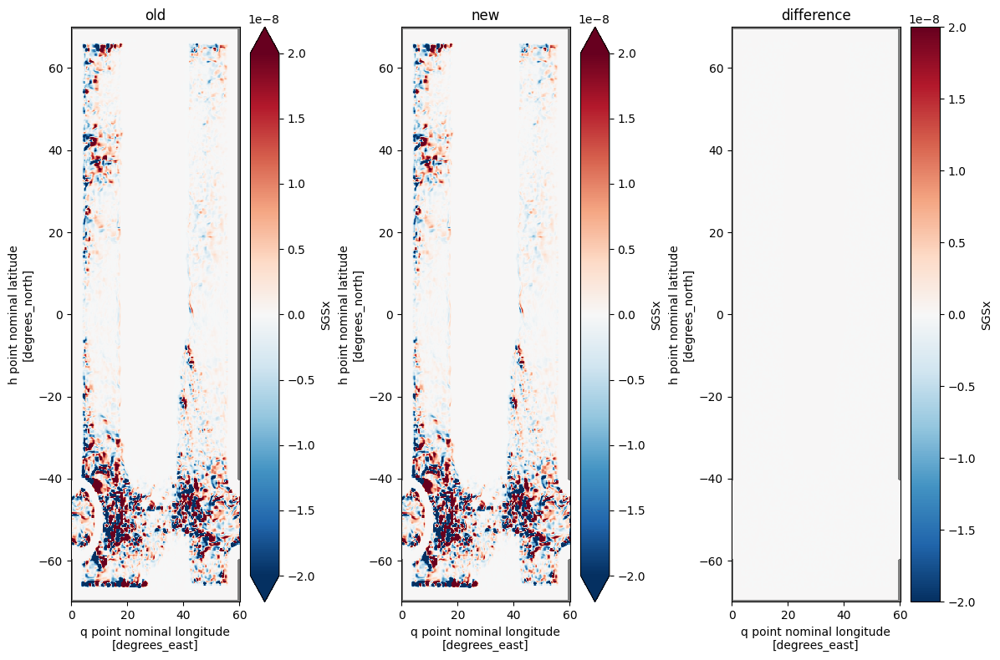

In [6]:
zl = -1
x = ds_test.SGSx.isel(time=1,zl=zl)
y = ds_new.SGSx.isel(time=6,zl=zl)

plt.figure(figsize=(12,8))
plt.subplot(1,3,1)
x.plot(vmin=-2e-8)
plt.gca().set_facecolor('gray')
plt.title('old')
plt.subplot(1,3,2)
y.plot(vmin=-2e-8)
plt.title('new')
plt.gca().set_facecolor('gray')
plt.subplot(1,3,3)
(x-y).plot(vmin=-2e-8)
plt.title('difference')
plt.gca().set_facecolor('gray')

plt.tight_layout()

In [7]:
dEdt = ((grid.interp(ds_test.SGSx * ds_test.uf, 'X') + grid.interp(ds_test.SGSy * ds_test.vf, 'Y')))

/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/ext3/miniconda3/lib/python3.11/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg


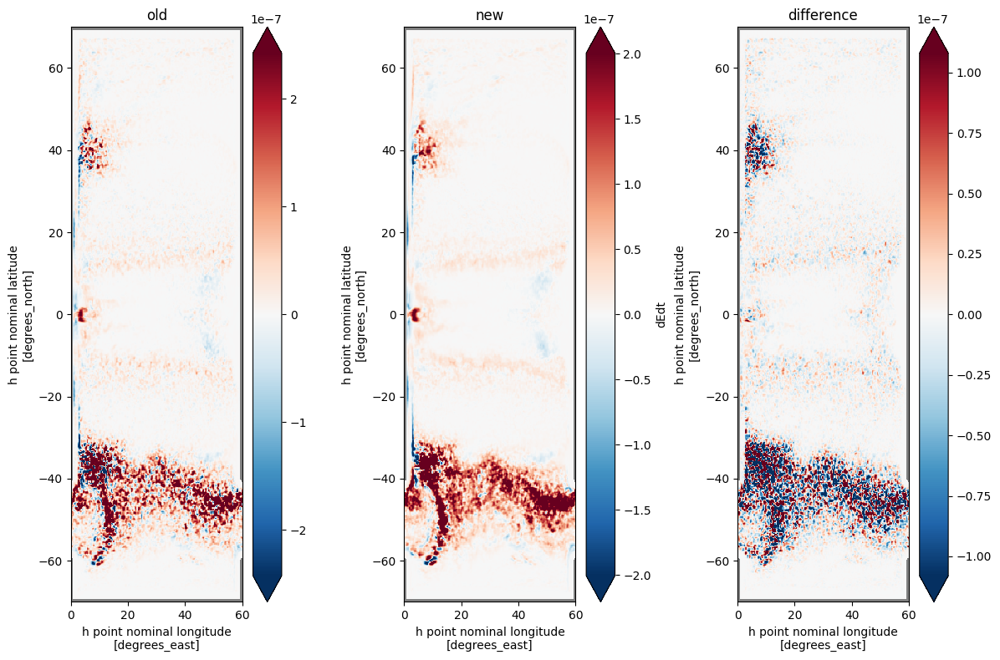

In [8]:
zl = 0
x = dEdt.mean('time').isel(zl=zl)
y = ds_new.dEdt.mean('time').isel(zl=zl)

plt.figure(figsize=(12,8))
plt.subplot(1,3,1)
x.plot(robust=True)
plt.gca().set_facecolor('gray')
plt.title('old')
plt.subplot(1,3,2)
y.plot(robust=True)
plt.title('new')
plt.gca().set_facecolor('gray')
plt.subplot(1,3,3)
(x-y).plot(robust=True)
plt.title('difference')
plt.gca().set_facecolor('gray')

plt.tight_layout()

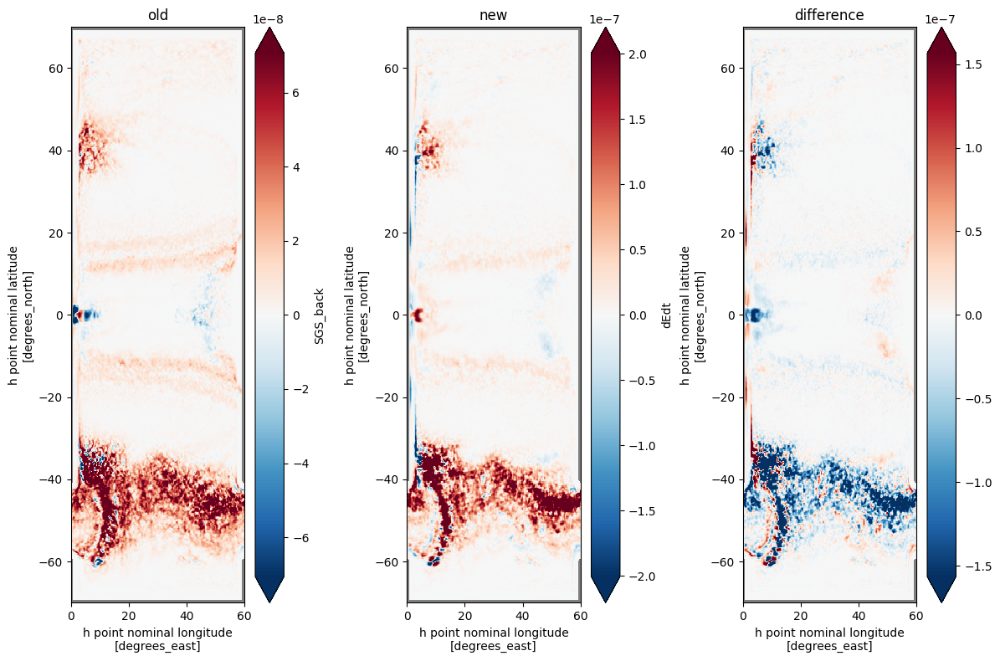

In [9]:
zl = 0
x = ds_new.SGS_back.mean('time').isel(zl=zl)
y = ds_new.dEdt.mean('time').isel(zl=zl)

plt.figure(figsize=(12,8))
plt.subplot(1,3,1)
x.plot(robust=True)
plt.gca().set_facecolor('gray')
plt.title('old')
plt.subplot(1,3,2)
y.plot(robust=True)
plt.title('new')
plt.gca().set_facecolor('gray')
plt.subplot(1,3,3)
(x-y).plot(robust=True)
plt.title('difference')
plt.gca().set_facecolor('gray')

plt.tight_layout()

# Filtering interfaces with GMfilter

In [85]:
from xgcm import Grid
import numpy as np
import xarray as xr
from xgcm.grid_ufunc import as_grid_ufunc
class GMFilter():
  '''
  Filter which uses Gent-McWilliams parameterization
  to perform filtering of layer interfaces
  '''
  def __init__(self, static):
    '''
    Required fields in static:
    area_t,
    dxCu, dxCv,
    dyCu, dyCv,
    wet_u, wet_v
    wet
    '''
    self.static = static

    self.grid = Grid(self.static, coords={
            'X': {'center': 'xh', 'outer': 'xq'},
            'Y': {'center': 'yh', 'outer': 'yq'}
            },
            boundary={'X': 'periodic', 'Y': 'fill'},
            fill_value = {'Y': 0})

  def diffusion_fluxes(self, eta):
    '''
    This function computes the diffusivity fluxes of
    filtered quantity "eta" defined in centers of
    grid cells (xh,yh) in finite volume formulation
    assuming unit diffusivity, that is:
    - Zonal flux through u-point edge integrated over the cell edge
    Fu = dyCu * diff(eta,'X') / dxCu
    - Meridional flux through v-point edge integrated over the cell edge
    Fv = dxCv * diff(eta,'Y') / dyCv

    Note: we skip minus sign as it is not needed later
    Note: values of eta on boundary is not required as
    Neumann B.C. will be applied
    '''
    static = self.static
    grid = self.grid

    # Removing NaNs here allows do not propagate them in space
    # Note: all B.C. are applied
    Fu = static.dyCu * grid.diff(eta.fillna(0.),'X') / static.dxCu * static.wet_u
    Fv = static.dxCv * grid.diff(eta.fillna(0.),'Y') / static.dyCv * static.wet_v

    return Fu, Fv

  def maximum_diffusivity_coefficients(self):
    '''
    Here we choose diffusivities in u and v points kappa_u and kappa_v
    as large as possible while gauranteeing monotonicity of the filter according to Lax
    where kappa_u and kappa_v have physical meaning of:
    kappa = diffusivity coefficient x time spacing

    For Lax-monotonicity we consider the coefficient in front of the eta_i,j
    and require its positivity
    1 - 1/area_t(dyCu/dxCu * kappa_u * 2 + dxCv/dyCv * kappa_v * 2) >= 0
    The equality is achieved when:
    kappa_u = 1/4 * area_t * dxCu / dyCu
    kappa_v = 1/4 * area_t * dyCv / dxCv

    Note: to compute area_t in u point, we need to consider minimum
    of area_t in two adjacent T-cells, and same of for v points
    '''
    static = self.static
    grid = self.grid

    area_t_u = grid.interp(static.area_t,'X')
    area_t_udiff = grid.diff(static.area_t,'X')

    # This is minimum between two adjacent points
    area_u = area_t_u - np.abs(0.5 * area_t_udiff)

    area_t_v = grid.interp(static.area_t,'Y')
    area_t_vdiff = grid.diff(static.area_t,'Y')

    # This is minimum between two adjacent points
    area_v = area_t_v - np.abs(0.5 * area_t_vdiff)

    # Note: here we use our area_u and area_v but not
    # those which are part of static
    kappa_u = 0.25 * area_u * static.dxCu / static.dyCu
    kappa_v = 0.25 * area_v * static.dyCv / static.dxCv

    return kappa_u, kappa_v

  def limit_fluxes(self, eta, Fu, Fv):
    '''
    This function assumes that perform
    one time step with layer interfaces as follows:
    eta_new = eta + (diff(Fu,'X') + diff(Fv,'Y')) / area_t

    And we want to be sure that after time step interfaces do
    not drop below the bathymetry, that is:
    eta_new >= bathymetry for all layers
    as long as interfaces were above bathymetry before diffusion
    if  eta >= bathymetry for all layers

    We introduce the volume enclosed into the water column
    below the interface:
    V = (eta-bathymetry) * area_t
    Then the limited fluxes should satisfy:
    diff(Fu,'X') + diff(Fv,'Y') + V >= 0.

    We assume that 4 fluxes on edges can work IN CONCERT (see Zalesak 1979 for definition),
    but we want to limit them independently
    Thus, we require (see divisor 4):
    Fu_{i+1/2}>0 -> -Fu_{i+1/2} + V_{i+1}/4 >=0
    Fu_{i+1/2}<0 -> +Fu_{i+1/2} + V_{i}/4   >=0

    Fv_{j+1/2}>0 -> -Fv_{j+1/2} + V_{j+1}/4 >=0
    Fu_{j+1/2}<0 -> +Fv_{j+1/2} + V_{j}/4   >=0
    '''

    static = self.static
    grid = self.grid

    # Compute volume below interface
    # Here we plus the depth_ocean, because
    # it is coordinate should be negative
    V = ((eta + static.depth_ocean) * static.area_t).fillna(0.) # Here we fill NaNs with zero accessible volume

    # Here we create arrays for V_{i+1,j} and V_{i,j+1}
    @as_grid_ufunc(signature="(X:center)->(X:outer)", boundary_width={'X':(1,1)})
    def index_plus_one(a):
        return a[...,1:]

    # See explanation of dask="parallelized" in
    # https://xgcm.readthedocs.io/en/latest/grid_ufuncs.html
    V_right = index_plus_one(grid, V, axis='X', dask="parallelized")
    V_top   = index_plus_one(grid, V, axis='Y', dask="parallelized")

    # Central value also should be given on a grid of outer values.
    @as_grid_ufunc(signature="(X:center)->(X:outer)", boundary_width={'X':(1,0)})
    def index_center(a):
        return a[...,:]
    Vu_center = index_center(grid, V, axis='X', dask="parallelized")
    Vv_center = index_center(grid, V, axis='Y', dask="parallelized")

    Fu = xr.where(Fu>0, np.minimum(Fu, V_right * 0.25), np.maximum(Fu, -Vu_center * 0.25))
    Fv = xr.where(Fv>0, np.minimum(Fv, V_top   * 0.25), np.maximum(Fv, -Vv_center * 0.25))

    return Fu, Fv

  def diffusion_iterations(self, eta, Niters=1, limit_fluxes=True):
    '''
    This function computes diffusivity fluxes (Fu,Fv)
    in finite volume formulation and performs time stepping as
    follows:
    eta = eta + (diff(Fu * kappa_u,'X') + diff(Fv * kappa_v,'Y')) / area_t

    where kappa_u and kappa_v have physical meaning of:
    kappa = diffusivity coefficient x time spacing

    and chosen as much as possible (while stable)
    '''

    static = self.static
    grid = self.grid

    kappa_u, kappa_v = self.maximum_diffusivity_coefficients()

    etaf = eta

    for iter in range(Niters):
      Fu, Fv = self.diffusion_fluxes(etaf)
      # Multiply by diffusivity
      Fu = Fu * kappa_u
      Fv = Fv * kappa_v
      if limit_fluxes:
        Fu, Fv = self.limit_fluxes(etaf, Fu, Fv)
      etaf = etaf + (grid.diff(Fu, 'X') + grid.diff(Fv, 'Y')) / static.area_t * static.wet

    return etaf

  def diffusion_fixed_factor(self, eta, filter_scale=4, limit_fluxes=True):
    '''
    This function computes diffusivity fluxes (Fu,Fv)
    in finite volume formulation and performs time stepping as
    follows:
    eta = eta + (diff(Fu * kappa_u,'X') + diff(Fv * kappa_v,'Y')) / area_t

    where kappa_u and kappa_v have physical meaning of:
    kappa = diffusivity coefficient x time spacing

    and chosen as much as possible (while stable)
    '''

    static = self.static
    grid = self.grid

    kappa_u, kappa_v = self.maximum_diffusivity_coefficients()

    # Niters * kappa = (dx*dy) * filter_scale**2 / 24
    Niters = max(float((static.area_u / kappa_u).max()), float((static.area_v / kappa_v).max())) * filter_scale**2 / 24.
    Niters = int(np.ceil(Niters))

    kappa_u = np.minimum(kappa_u, static.area_u * filter_scale**2 / 24. / Niters)
    kappa_v = np.minimum(kappa_v, static.area_v * filter_scale**2 / 24. / Niters)

    etaf = eta

    print('Number of iterations of filter:', Niters)

    for iter in range(Niters):
      Fu, Fv = self.diffusion_fluxes(etaf)
      # Multiply by diffusivity
      Fu = Fu * kappa_u
      Fv = Fv * kappa_v
      if limit_fluxes:
        Fu, Fv = self.limit_fluxes(etaf, Fu, Fv)
      etaf = etaf + (grid.diff(Fu, 'X') + grid.diff(Fv, 'Y')) / static.area_t * static.wet

    return etaf

In [90]:
ref = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/snapshots_*', decode_times=False, chunks={'time':1, 'zl':1, 'zi':1})[['e']]
ref_static = xr.open_mfdataset('/scratch/pp2681/mom6/Neverworld2/simulations/R32/static.nc', decode_times=False).squeeze().drop_vars('time')

In [103]:
etaf_FGR = GMFilter(ref_static).diffusion_fixed_factor(ref.e.isel(time=0),filter_scale=10,limit_fluxes=True)

/ext3/miniconda3/lib/python3.11/site-packages/dask/_task_spec.py:745: RuntimeWarning: invalid value encountered in divide
  return self.func(*new_argspec)


Number of iterations of filter: 48


In [104]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    etaf_FGR = etaf_FGR.compute()

[########################################] | 100% Completed | 306.13 s


In [106]:
filter_h = gcm_filters.Filter(
                filter_scale=10, # filter scale accounts for change in resolution (32/4) and FGR (3)
                dx_min=1,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.REGULAR_WITH_LAND,
                grid_vars={'wet_mask': ref_static.wet}
                )
with ProgressBar():
    etaf_baseline = filter_h.apply(ref.e.isel(time=0), dims=['yh','xh']).compute()

[########################################] | 100% Completed | 22.95 ss


Text(0.5, 1.0, 'Subfilter e. GCMfilter')

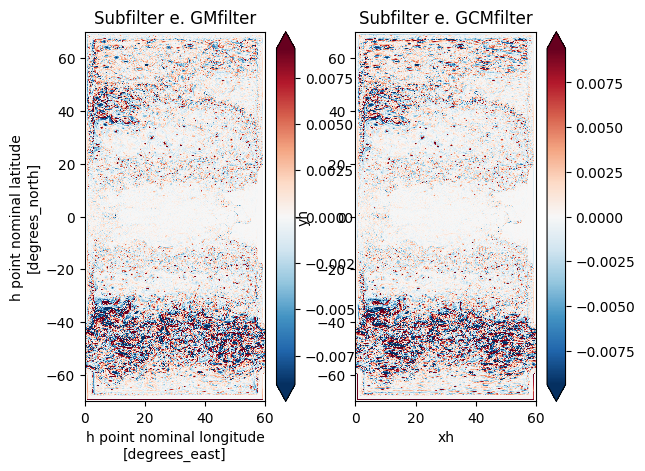

In [115]:
plt.subplot(1,2,1)
(etaf_FGR - ref.e.isel(time=0)).isel(zi=0).plot(robust=True)
plt.title('Subfilter e. GMfilter')
plt.subplot(1,2,2)
(etaf_baseline - ref.e.isel(time=0)).isel(zi=0).plot(robust=True)
plt.title('Subfilter e. GCMfilter')

Text(0.5, 1.0, '$\\overline{\\eta}^{GM} - \\overline{\\eta}$: GCfilter - GCMfilter')

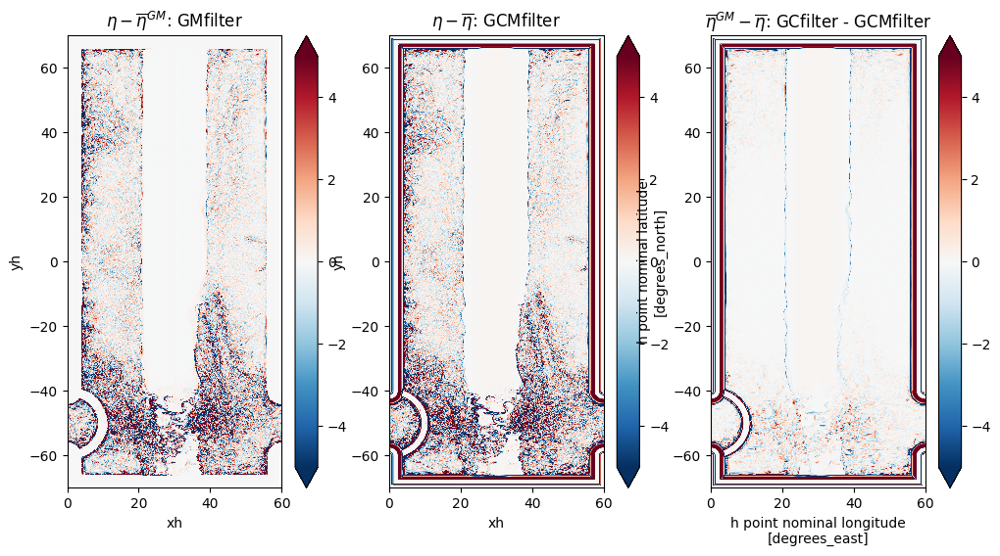

In [125]:
plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
(ref.e.isel(time=0)-etaf_FGR).isel(zi=-3).plot(vmin=-5)
plt.title('$\\eta-\overline{\\eta}^{GM}$: GMfilter')
plt.subplot(1,3,2)
(ref.e.isel(time=0)-etaf_baseline).isel(zi=-3).plot(vmin=-5)
plt.title('$\\eta-\overline{\\eta}$: GCMfilter')
plt.subplot(1,3,3)
(etaf_FGR - etaf_baseline).isel(zi=-3).plot(vmin=-5)
plt.title('$\overline{\\eta}^{GM} - \overline{\\eta}$: GCfilter - GCMfilter')